In [1]:
%load_ext autoreload
%autoreload 2

from geosnap import DataStore
import pandarm as pdna
import geopandas as gpd

%load_ext watermark
%watermark -a 'eli knaap'  -d -u -iv

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Author: eli knaap

Last updated: 2025-11-29

pandarm  : 0.0.2
geopandas: 1.1.1
geosnap  : 0.15.4.dev0+g08b0d60a8.d20251109



In [2]:
datasets = DataStore()

In [3]:
dc = datasets.tracts_2020()
dc = dc[dc.geoid.str.startswith("11")]

<Axes: >

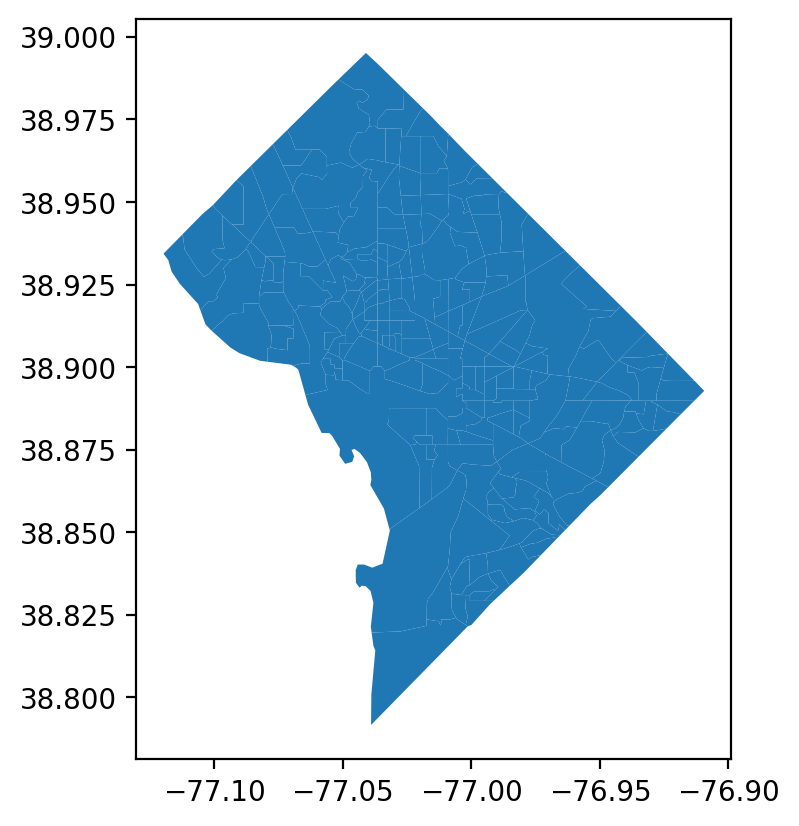

In [4]:
dc.plot()

## collecting (and projecting) networks from OSM

In [5]:
dcnet = pdna.Network.from_gdf(dc)

/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/pandarm/loaders/osm.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes["x"] = nodes.centroid.x
/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/pandarm/loaders/osm.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes["y"] = nodes.centroid.y


Generating contraction hierarchies with 16 threads.
Setting CH node vector of size 81541
Setting CH edge vector of size 250944
Range graph removed 253890 edges of 501888
. 10% . 20% . 30% . 40% . 50% . 60% . 70% . 80% . 90% . 100%


<Axes: >

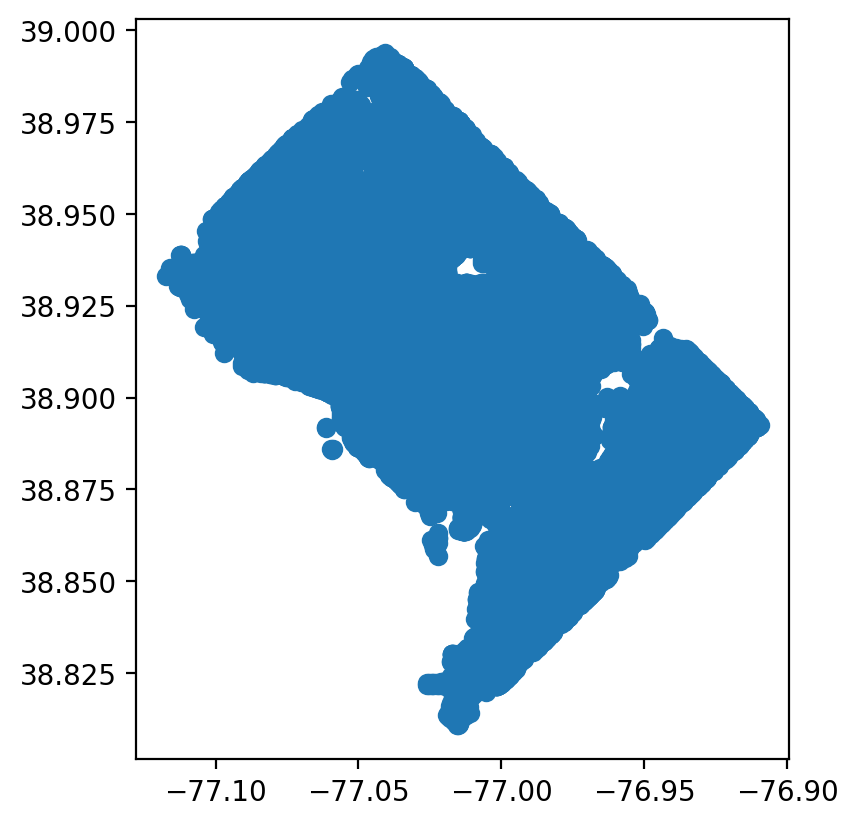

In [6]:
dcnet.nodes_df.plot()

In [7]:
dcnet.nodes_df

,x,y,geometry
osmid,,,
281072,-77.108256,38.935830,POINT (-77.10826 38.93583)
29918140,-77.047158,38.965092,POINT (-77.04716 38.96509)
30066940,-77.003440,38.884208,POINT (-77.00344 38.88421)
30066941,-77.003434,38.883326,POINT (-77.00343 38.88333)
30066942,-77.002146,38.883325,POINT (-77.00215 38.88332)
...,...,...,...
13290039693,-77.024983,38.906161,POINT (-77.02498 38.90616)
13291201708,-77.041490,38.923355,POINT (-77.04149 38.92335)
13291420690,-77.002776,38.904056,POINT (-77.00278 38.90406)


<Axes: >

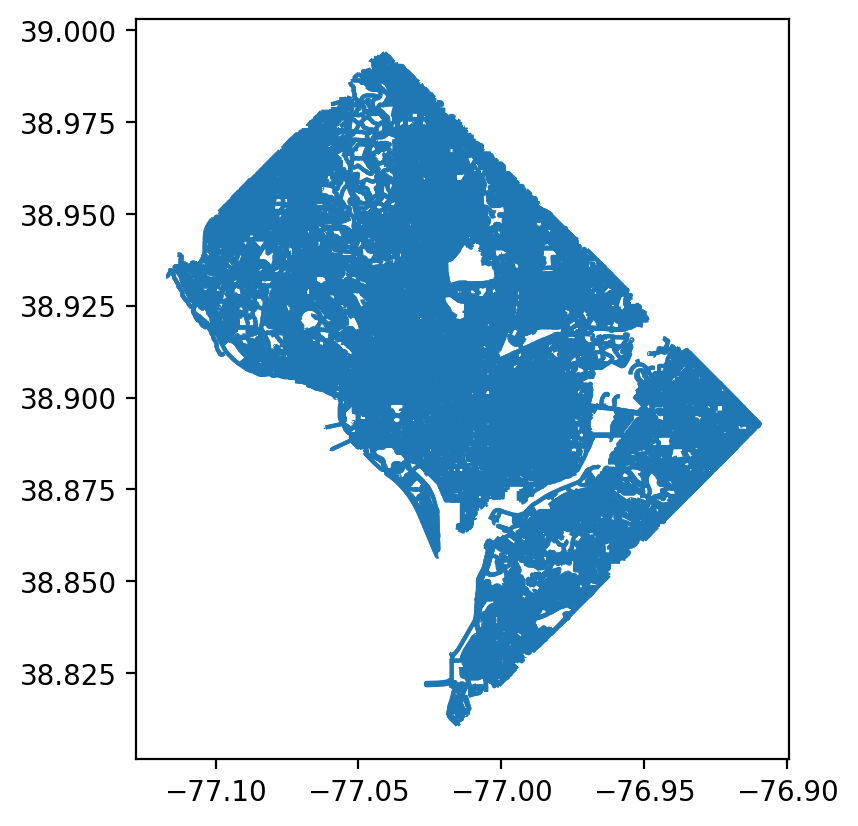

In [8]:
dcnet.edges_df.plot()

In [9]:
dcnet = dcnet.to_crs(dc.estimate_utm_crs())

Generating contraction hierarchies with 16 threads.
Setting CH node vector of size 81541
Setting CH edge vector of size 250944
Range graph removed 253890 edges of 501888
. 10% . 20% . 30% . 40% . 50% . 60% . 70% . 80% . 90% . 100%


In [10]:
dcnet.nodes_df.crs

<Projected CRS: EPSG:32618>
Name: WGS 84 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 78°W and 72°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Canada - Nunavut; Ontario; Quebec. Colombia. Cuba. Ecuador. Greenland. Haiti. Jamaica. Panama. Turks and Caicos Islands. United States (USA). Venezuela.
- bounds: (-78.0, 0.0, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

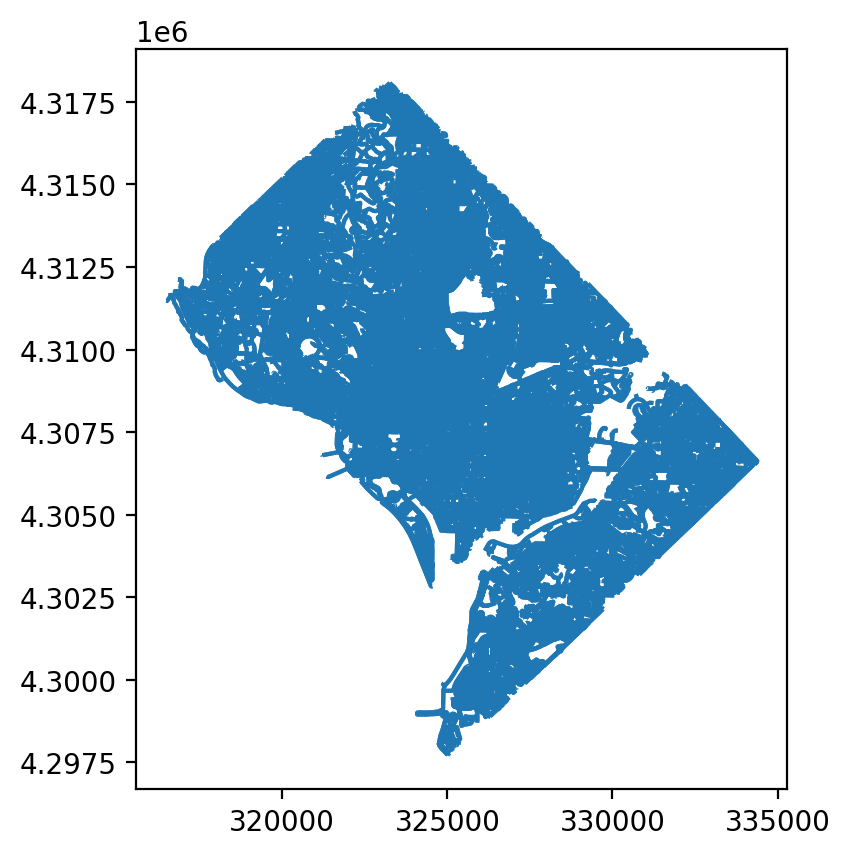

In [11]:
dcnet.edges_df.plot()

In [12]:
import osmnx as ox

In [13]:
rest = ox.features_from_polygon(dc.union_all(), tags={"amenity": "restaurant"})

In [14]:
rest.explore()

## distance to nearest POIs

In [15]:
rest = rest.to_crs(dc.estimate_utm_crs())

In [16]:
# the query returns mixed geometries; downcast polygons to points
rest["geometry"] = rest.geometry.centroid

In [17]:
# attach restaurants to their nearest intersection
dcnet.set_pois(
    "restaurants",
    maxdist=2000,
    maxitems=20,
    x_col=rest.geometry.x.values,
    y_col=rest.geometry.y.values,
)

In [18]:
# dataframe of distance from each node to 20 nearest restaurants up to 2km
nearest_rests = dcnet.nearest_pois(2000, "restaurants", num_pois=20)

In [19]:
nearest_rests

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
osmid,,,,,,,,,,,,,,,,,,,,
281072,1722.780029,1751.822021,1795.729004,1938.045044,1961.211060,1999.130981,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
29918140,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
30066940,341.312988,341.312988,349.842987,349.842987,366.734985,366.734985,373.165009,373.165009,405.477997,418.924988,418.924988,462.247986,493.579987,514.273010,518.981995,535.489990,535.934998,535.934998,586.771973,605.823975
30066941,336.481995,336.481995,422.877991,422.877991,429.308014,429.308014,448.006989,448.006989,474.704987,474.704987,486.764008,503.627991,518.390991,529.742981,549.723022,571.655029,572.099976,572.099976,575.125000,641.989014
30066942,372.386993,372.386993,378.816986,378.816986,424.213989,424.213989,447.933014,447.933014,462.292999,462.292999,467.899994,499.231995,521.164001,521.335999,521.335999,524.633972,554.486023,590.773010,598.215027,605.546997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13290039693,32.282001,34.026001,62.501999,62.501999,96.134003,170.901001,170.901001,189.725006,229.513000,229.513000,267.623993,280.729004,282.670990,338.407013,390.432007,418.934998,423.709991,425.441010,439.636993,450.427002
13291201708,16.622999,36.609001,55.391998,113.616997,113.616997,130.654007,130.654007,169.727005,192.940994,214.862000,216.268005,216.268005,224.903000,224.903000,229.115997,229.115997,229.115997,245.440994,299.851013,299.851013
13291420690,5.134000,215.602997,237.639008,304.872986,551.218994,593.856018,610.981018,610.981018,613.841980,617.375000,631.005005,633.687012,633.687012,633.687012,635.859009,663.991028,664.778015,682.791992,702.434021,702.434021


<Axes: >

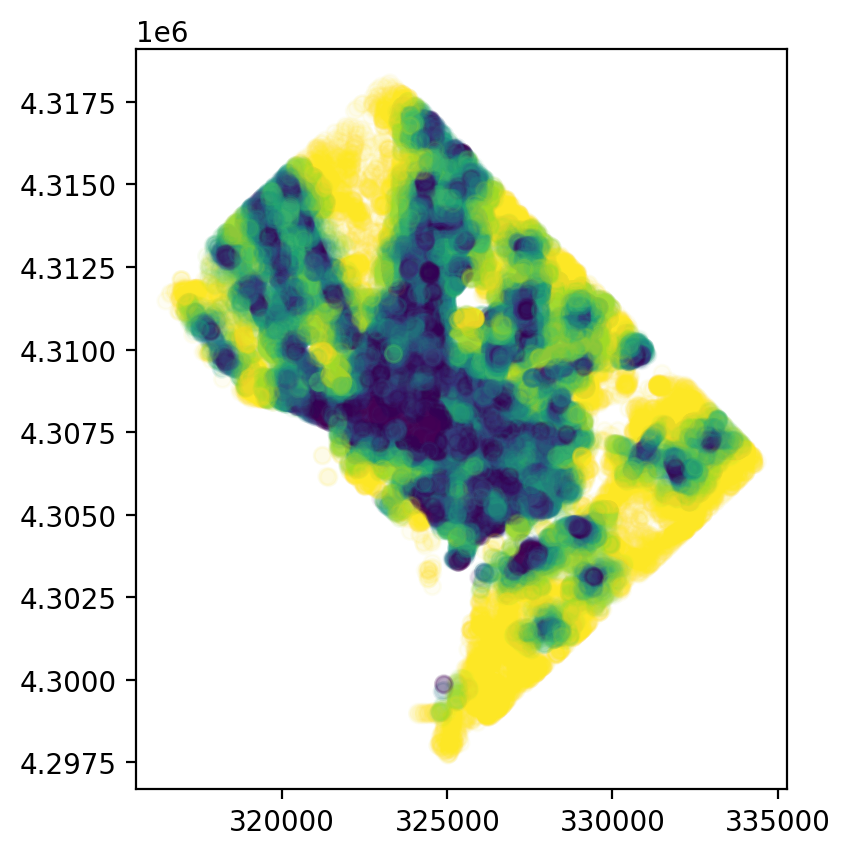

In [20]:
# join to intersection geometries and visualize distance to nearest restaurant
dcnet.nodes_df.join(nearest_rests[1]).rename(columns={1: "dist"}).plot(
    "dist", scheme="quantiles", k=8, alpha=0.05
)

/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/mapclassify/classifiers.py:1767: UserWarning: Not enough unique values in array to form 8 classes. Setting k to 7.
  self.bins = quantile(y, k=k)


<Axes: >

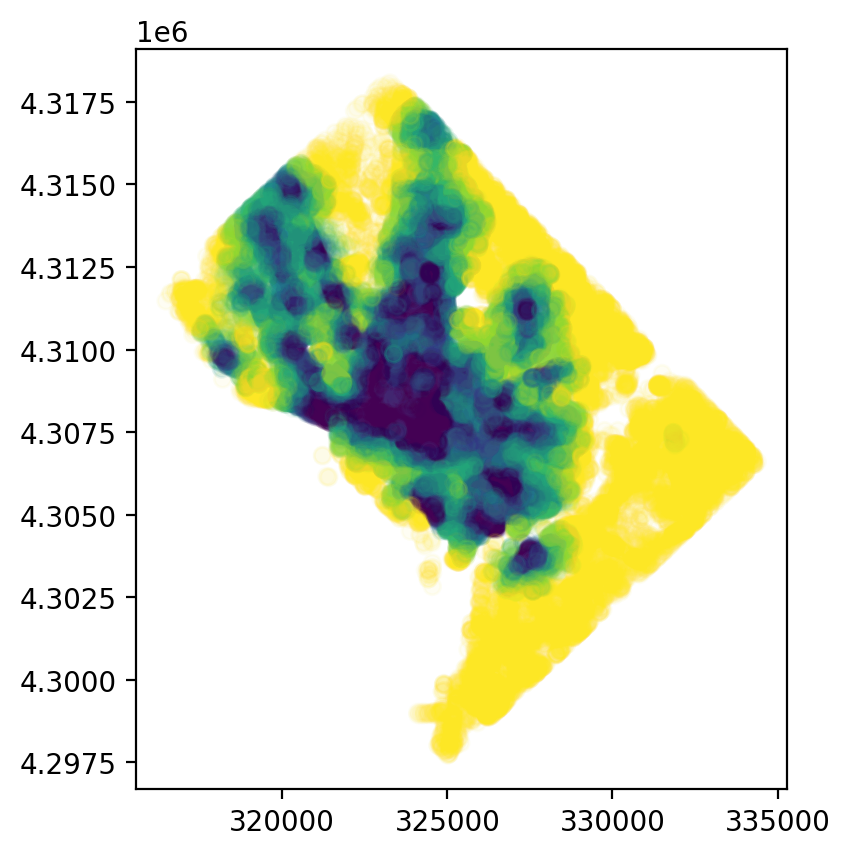

In [21]:
# distance to *5th nearest* restaurant, up to 2km
dcnet.nodes_df.join(nearest_rests[5]).rename(columns={5: "dist"}).plot(
    "dist", scheme="quantiles", k=8, alpha=0.05
)

## aggregations (network-based spatial lag)

In [22]:
# create variable to aggregate. Since these are just binary locations set everything to 1
rest["count"] = 1

In [23]:
# get the nearest intersection to each restaurant
rest_nodes = dcnet.get_node_ids(rest.geometry.x.values, rest.geometry.y.values)

In [24]:
rest_nodes

0        1624353716
1        7568297894
2        7568297894
3        2790488465
4        3519479345
           ...     
1079    12564695820
1080    12564695820
1081    12564695820
1082    12564695820
1083    12542345597
Name: node_id, Length: 1084, dtype: int64

In [25]:
# set the restaurants onto the network to be aggregated

dcnet.set(rest_nodes, rest["count"].values, name="restaurants")

In [26]:
agg = dcnet.aggregate(2000, name="restaurants")

In [27]:
agg

osmid
281072           0.415641
29918140         0.000000
30066940        53.069074
30066941        53.408618
30066942        54.561703
                  ...    
13290039693    143.102767
13291201708     79.105740
13291420690     40.590050
13293699829      6.587646
13293699832      6.781490
Length: 81541, dtype: float64

<Axes: >

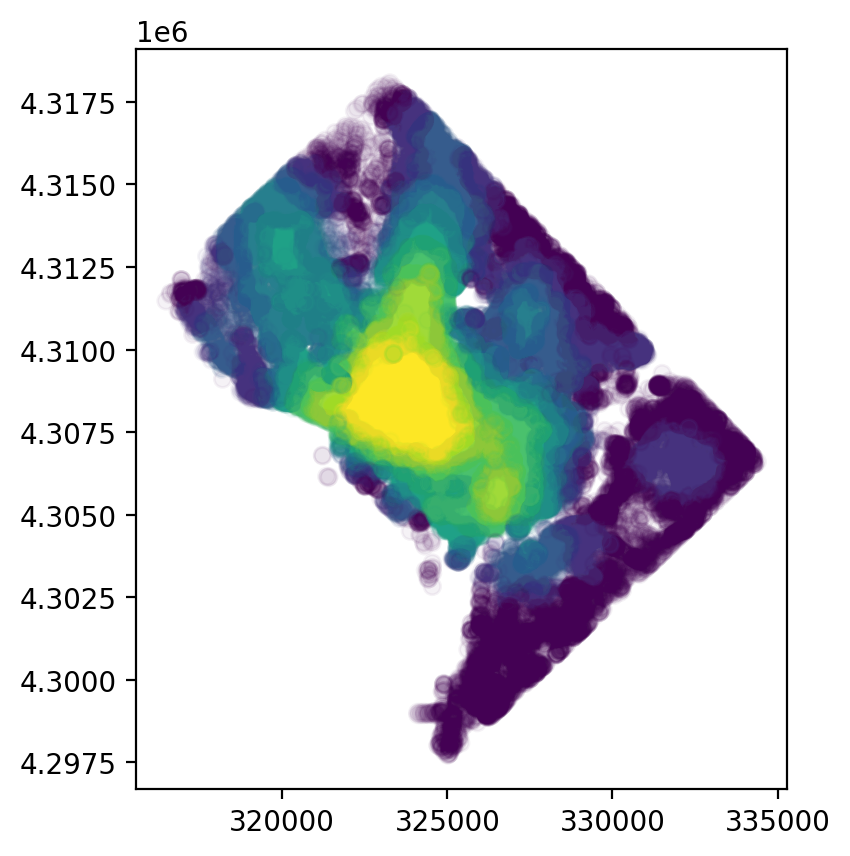

In [28]:
dcnet.nodes_df.join(agg.rename("access")).plot("access", scheme="quantiles", k=8, alpha=0.05)

In [29]:
from lonboard import viz
from lonboard import basemap
from mapclassify.util import get_color_array

dc_nodes = dcnet.nodes_df.copy().assign(access=agg)
dc_nodes = dc_nodes.to_crs(dc.estimate_utm_crs())
dc_nodes["geometry"] = dc_nodes["geometry"].buffer(20)
colors = get_color_array(dc_nodes.access, scheme="fisher_jenks", k=8, cmap='inferno')
viz(
    dcnet.nodes_df.copy().assign(access=agg),
    scatterplot_kwargs=(
        dict(
            get_fill_color=colors,
            get_radius=36,
            opacity=0.7,
        )
    ),
    map_kwargs={'basemap_style':basemap.CartoBasemap.Positron, }
)

/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/lonboard/_geoarrow/ops/reproject.py:113: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(basemap_style=<CartoBasemap.Positron: 'https://basemaps.cartocdn.com/gl/positron-gl-style/style.json'>, cu…

<Axes: >

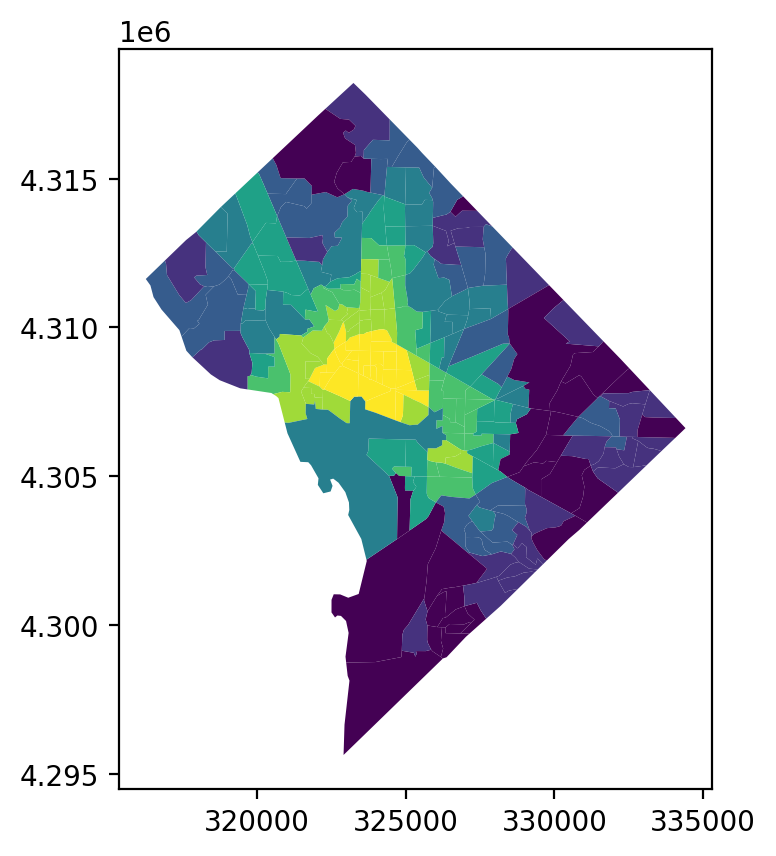

In [30]:
# visualize on tracts instead
dc = dc.to_crs(dc.estimate_utm_crs())  # make sure CRS matches network!
dc["nodes"] = dcnet.get_node_ids(dc.centroid.x, dc.centroid.y)
dc.merge(agg.rename("access"), left_on="nodes", right_index=True).plot(
    "access",
    scheme="quantiles",
    k=8,
)

In [31]:
dc.merge(agg.rename("access"), left_on="nodes", right_index=True).explore(
    "access",
    scheme="quantiles",
    k=8,
    alpha=0.5,
    tiles="cartodb positron",
    style_kwds={"weight": 0.5},
)

## isochrones (all destinations with X distance)

In [32]:
irvine = ox.geocode_to_gdf("irvine, ca")

In [33]:
irvine.explore()

In [34]:
libraries = ox.features_from_polygon(irvine.union_all(), tags={"amenity": "library"})

In [35]:
libraries

geometry  \
element  id                                                               
node     13093009764                         POINT (-117.80789 33.6633)   
relation 2275965      POLYGON ((-117.84636 33.64566, -117.84642 33.6...   
way      101916822    POLYGON ((-117.77875 33.69948, -117.77862 33.6...   
         171169252    POLYGON ((-117.84107 33.64751, -117.84079 33.6...   
         207084927    POLYGON ((-117.77801 33.676, -117.77799 33.676...   
         678012434    POLYGON ((-117.78539 33.73037, -117.7853 33.73...   
         730434323    POLYGON ((-117.82071 33.6609, -117.82056 33.66...   

                      amenity addr:city addr:country addr:housenumber  \
element  id                                                             
node     13093009764  library       NaN          NaN              NaN   
relation 2275965      library    Irvine          NaN              520   
way      101916822    library    Irvine           US            14361   
         171169252    library    Irvine          NaN              101   
         207084927    library    Irvine          NaN             5500   
         678012434    library    Irvine           US            13109   
         730434323    library    Irvine          NaN             4512   

                     addr:postcode addr:state          addr:street  \
element  id                                                          
node     13093009764           NaN        NaN                  NaN   
relation 2275965             92617        NaN     Biological Court   
way      101916822           92604         CA          Yale Avenue   
         171169252           92617        NaN        Gateway Court   
         207084927           92618         CA  Irvine Center Drive   
         678012434           92602         CA      Old Myford Road   
         730434323           92612         CA         Sandburg Way   

                                          alt_name    building  ...  \
element  id                                                     ...   
node     13093009764                           NaN         NaN  ...   
relation 2275965                               NaN         yes  ...   
way      101916822    Heritage Park Branch Library         yes  ...   
         171169252                             NaN         yes  ...   
         207084927                             NaN  university  ...   
         678012434                             NaN         yes  ...   
         730434323                             NaN         yes  ...   

                     name:etymology  ref short_name start_date description  \
element  id                                                                  
node     13093009764            NaN  NaN        NaN        NaN         NaN   
relation 2275965                NaN  520       SLIB        NaN         NaN   
way      101916822              NaN  NaN        NaN        NaN         NaN   
         171169252     Jack Langson  102       LLIB       1965         NaN   
         207084927              NaN  NaN        NaN        NaN     Library   
         678012434              NaN  NaN        NaN        NaN         NaN   
         730434323              NaN  NaN        NaN        NaN         NaN   

                             source          type air_conditioning layer  \
element  id                                                                
node     13093009764            NaN           NaN              NaN   NaN   
relation 2275965                NaN  multipolygon              yes     1   
way      101916822              NaN           NaN              NaN   NaN   
         171169252              NaN           NaN              NaN   NaN   
         207084927              NaN           NaN              NaN   NaN   
         678012434              NaN           NaN              NaN   NaN   
         730434323    USGS Geonames           NaN              NaN   NaN   

                     roof:shape  
element  id                      
no

In [36]:
libraries["geometry"] = libraries.geometry.centroid
libraries.explore(color='red', style_kwds={'radius':10})

/var/folders/j8/5bgcw6hs7cqcbbz48d6bsftw0000gp/T/ipykernel_11447/3122961005.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  libraries["geometry"] = libraries.geometry.centroid


In [37]:
sse = gpd.tools.geocode("UC Irvine school of social ecology")

In [38]:
sse.explore(color='red', style_kwds={'radius':20})

In [39]:
irvine_net = pdna.Network.from_gdf(irvine)

/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/pandarm/loaders/osm.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes["x"] = nodes.centroid.x
/Users/knaaptime/miniforge3/envs/geosnap/lib/python3.13/site-packages/pandarm/loaders/osm.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes["y"] = nodes.centroid.y


Generating contraction hierarchies with 16 threads.
Setting CH node vector of size 43693
Setting CH edge vector of size 121440
Range graph removed 124598 edges of 242880
. 10% . 20% . 30% . 40% . 50% . 60% . 70% . 80% . 90% . 100%


In [40]:
library_nodes = irvine_net.get_node_ids(libraries.geometry.x.values, libraries.geometry.y.values)
sse_node = irvine_net.get_node_ids(sse.geometry.x.values, sse.geometry.y.values)

In [41]:
sse_node

0    11329030680
Name: node_id, dtype: int64

In [42]:
library_nodes

0    13093009739
1    11103388255
2     4794678119
3     1955727850
4     8855712754
5     6348382796
6      122900129
Name: node_id, dtype: int64

In [43]:
irvine_net.precompute(2000)

In [44]:
# all intersections within 2km of irvine libraries
library_iso = irvine_net.nodes_in_range(library_nodes, 2000)

In [45]:
# distance from each library (source) to all intersections (destination) and associated cost (length), up to 2km
library_iso

,source,destination,length
0,13093009739,13093009739,0.000000
1,13093009739,13093009738,7.721000
2,13093009739,13093009737,23.875999
3,13093009739,13093009741,30.834000
4,13093009739,13093009736,51.742001
...,...,...,...
15947,122900129,12383412781,1998.915039
15948,122900129,12375820859,1999.171021
15949,122900129,3744750544,1999.318970
15950,122900129,6788618364,1999.496948


### intersections within 2km walk of UCI Langson Library

In [46]:
m = irvine_net.nodes_df[
    irvine_net.nodes_df.index.isin(
        library_iso.query(f"source=={library_nodes[3]}").destination.values
    )
].explore(tiles="cartodb positron")
irvine_net.nodes_df.loc[[library_nodes[3]]].explore(m=m, color="red", style_kwds={"radius": 10})

## shortest paths

In [47]:
single_path = irvine_net.shortest_path(sse_node[0], library_nodes[0])

In [48]:
# list of nodes in path from SSE to first library
single_path

array([11329030680,  8972594986,  8972595007,  8972595008, 11329030701,
        2523636562,  2523636559,  7041087144,  7041087148,  7041087147,
        7041087141, 12513737857,  9215126725,  9215110210, 11101164672,
         122633620,  9215126727,  9215110165,  2894898447,  2894898450,
        8921439881,  8921439880, 12377019591, 12377019589,  8921439876,
        8921439875, 12377019730,  8921439872,  9215110150,  9630951001,
        1832669174,  1836720579,  1836720582,  8921439815,   122779928,
         123058172, 11098805982,  1824581124,  1832669202,   122959101,
       11117464711,  2321316141,  2321316238,  2321316199,  2321316203,
       12372902839, 12372902837, 12384426815, 12384426818, 12384426846,
         123066066,   123066070,   122939960,   122746176,   123066075,
       12434680473, 12434680474, 12434680476,   123024133, 12434680475,
       12372902850,   122713342,   122623216,   122803528, 12384443880,
       12372831127,  2323342454,  2323342457,  9015654384, 12426

In [49]:
# reconstruct the path using geometries from edge_df
irvine_net.edges_df[
    (irvine_net.edges_df["from"].isin(single_path)) & (irvine_net.edges_df["to"].isin(single_path))
].explore(style_kwds={"weight": 5})

(you can see the path reconstruction is imperfect in the map because some edges have the same from/to node pair; to do this correctly, we'd take only the shortest edge with the same from/to using a groupby or something)

In [50]:
single_path_line = irvine_net.edges_df[
    (irvine_net.edges_df["from"].isin(single_path)) & (irvine_net.edges_df["to"].isin(single_path))
]

In [51]:
single_path_line = single_path_line.groupby(["from", "to"])[["length"]].min().reset_index()

In [52]:
single_path_line

,from,to,length
0,122623216,122713342,84.935547
1,122623216,122803528,67.042472
2,122633620,9215126727,10.464725
3,122633620,11101164672,10.870941
4,122713342,122623216,84.935547
...,...,...,...
147,13093009737,13093009736,27.866400
148,13093009737,13093009738,16.155781
149,13093009738,13093009737,16.155781
150,13093009738,13093009739,7.721657


In [53]:
idxer = single_path_line.set_index(['from', 'to', 'length']).index

In [54]:
irvine_net.edges_df[
    irvine_net.edges_df.set_index(["from", "to", "length"]).index.isin(idxer)
].explore(style_kwds={"weight": 5})

In [55]:
paths = irvine_net.shortest_paths([sse_node[0] for i in range(len(library_nodes))], library_nodes)

In [56]:
# list of nodes in the shortest path from the school of social ecology to each of the libraries in Irvine
paths

[array([11329030680,  8972594986,  8972595007,  8972595008, 11329030701,
         2523636562,  2523636559,  7041087144,  7041087148,  7041087147,
         7041087141, 12513737857,  9215126725,  9215110210, 11101164672,
          122633620,  9215126727,  9215110165,  2894898447,  2894898450,
         8921439881,  8921439880, 12377019591, 12377019589,  8921439876,
         8921439875, 12377019730,  8921439872,  9215110150,  9630951001,
         1832669174,  1836720579,  1836720582,  8921439815,   122779928,
          123058172, 11098805982,  1824581124,  1832669202,   122959101,
        11117464711,  2321316141,  2321316238,  2321316199,  2321316203,
        12372902839, 12372902837, 12384426815, 12384426818, 12384426846,
          123066066,   123066070,   122939960,   122746176,   123066075,
        12434680473, 12434680474, 12434680476,   123024133, 12434680475,
        12372902850,   122713342,   122623216,   122803528, 12384443880,
        12372831127,  2323342454,  2323342457,  901

In [57]:
# shortest path from SSE to last library
irvine_net.edges_df[
    (irvine_net.edges_df["from"].isin(paths[-1])) & (irvine_net.edges_df["to"].isin(paths[-1]))
].explore(style_kwds={"weight": 5})